In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
sns.set_theme(style="darkgrid")
import sklearn as sk
import joblib
#from sklearn.pipeline import Pipeline
from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import cross_val_score,cross_validate
import timeit


In [12]:
import lifelines
from lifelines import CoxPHFitter
from lifelines.utils import k_fold_cross_validation

In [3]:
train = pd.read_csv("train.csv",index_col = 0)

In [4]:
train.head()

,gender_2.0,cad_1.0,prior_acute_mi_1.0,prior_cardio_surg_1.0,prior_pci_1.0,prior_cabg_1.0,prior_valve_replace_1.0,prior_bav_1.0,prior_af_1.0,prior_generator_1.0,...,iliac_mld_right,femoral_mld_left,femoral_mld_right,lower_bound,upper_bound,death_observed,death_in_study,discharge_status_new,fup_status_30d_new,fup_status_12mth_new
ID,,,,,,,,,,,,,,,,,,,,,
4405,1.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,9.8,8.9,9.2,391.0,inf,False,False,1.0,1.0,1.0
10699,0.0,1.0,0.0,1.0,0.0,0.0,1.0,0.0,0.0,0.0,...,8.8,7.0,7.0,435.0,inf,False,False,1.0,1.0,1.0
8677,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,5.3,4.5,4.4,364.0,inf,False,False,1.0,1.0,1.0
3263,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,13.0,8.8,10.0,31.0,inf,False,False,1.0,1.0,NaN
2459,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,8.8,7.5,7.5,34.0,inf,False,False,1.0,1.0,NaN


## No interval

In [5]:
#X_train = train.query('death_observed == True or death_in_study == False')
outcome_columns = ['death_in_study','upper_bound',
                       'discharge_status_new','fup_status_30d_new', 'fup_status_12mth_new','lower_bound','death_observed']
X_train = train.drop(outcome_columns,axis=1)

In [6]:
from sklearn.preprocessing import StandardScaler
scaler =  StandardScaler()
X_train_scale = scaler.fit_transform(X_train)
X_train_scale = pd.DataFrame(X_train_scale,columns=X_train.columns,index=train.index)
X_train_scale = pd.concat([
        X_train_scale,
        train[['lower_bound','death_observed']]
    ],
    axis=1)

In [7]:
from collections import Counter
[k for k, v in Counter(X_train_scale.index).items() if v > 1]


[]

In [62]:
#X_train = X_train.drop([
#    'anaesthesia_2.0',
#    'anaesthesia_4.0',
#    'prior_valve_replace_1.0',
#    'prior_cardio_surg_1.0',
#    'ecg_rhythm_sinus_1.0',
#    'prior_cabg_1.0',
#    'ecg_rhythm_Fibrillation_1.0',
#    'ecg_rhythm_paced_1.0'],axis=1)


In [8]:
cph = CoxPHFitter()
cph.fit(X_train_scale, 
        duration_col='lower_bound', 
        event_col='death_observed')
        #strata = [
        #    'meds_aspirin_1.0',
        #    'ecg_conduct_none_1.0',
        #    'ecg_conduct_LBBB_1.0',
        #    'annualar_calc_ctaort_1.0'])

<lifelines.CoxPHFitter: fitted with 12898 total observations, 12313 right-censored observations>

In [9]:
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 12898 total observations, 12313 right-censored observations>
             duration col = 'lower_bound'
                event col = 'death_observed'
      baseline estimation = breslow
   number of observations = 12898
number of events observed = 585
   partial log-likelihood = -4849.98
         time fit was run = 2024-05-31 04:01:55 UTC

---
                              coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                           
gender_2.0                    0.06       1.06       0.06            -0.07             0.18                 0.93                 1.20
cad_1.0                       0.01       1.01       0.05            -0.09             0.11                 0.91                 1.11
prior_acute_mi_1.0           -0.01       0.99       0.04            -0.10             0.07                 0.91                 1.08
prior_cardio_surg_1.0        -0.05       0.95       0.10            -0.25             0.14                 0.78                 1.15
prior_pci_1.0                 0.02       1.02       0.05            -0.08             0.11                 0.93                 1.12
prior_cabg_1.0               -0.02       0.98       0.09            -0.20             0.16                 0.82                 1.17
prior_valve_replace_1.0       0.16       1.17       0.12            -0.07             0.39                 0.93                 1.48
prior_bav_1.0                 0.01       1.01       0.03            -0.05             0.07                 0.95                 1.08
prior_af_1.0                  0.14       1.15       0.05             0.04             0.24                 1.04                 1.27
prior_generator_1.0           0.07       1.08       0.06            -0.03             0.18                 0.97                 1.20
prior_ccf_1.0                 0.10       1.10       0.04             0.01             0.18                 1.01                 1.20
prior_stroke_1.0              0.03       1.03       0.04            -0.05             0.10                 0.95                 1.11
prior_tia_1.0                 0.01       1.01       0.04            -0.07             0.09                 0.94                 1.09
prior_carotid_sten_2.0        0.01       1.01       0.04            -0.07             0.09                 0.94                 1.09
prior_carotid_sten_3.0       -0.03       0.97       0.04            -0.11             0.06                 0.89                 1.06
prior_carotid_sten_4.0       -0.01       0.99       0.04            -0.09             0.08                 0.91                 1.08
prior_carotid_sten_5.0        0.05       1.05       0.05            -0.04             0.14                 0.96                 1.15
prior_pad_1.0                 0.12       1.13       0.04             0.05             0.20                 1.05                 1.22
chronic_lung_2.0              0.08       1.08       0.04            -0.00             0.16                 1.00                 1.18
chronic_lung_3.0              0.13       1.14       0.04             0.06             0.20                 1.06                 1.23
chronic_lung_4.0              0.10       1.11       0.03             0.04             0.17                 1.04                 1.18
hypertension_1.0             -0.00       1.00       0.04            -0.08             0.08                 0.92                 1.09
diabetes_1.0                  0.03       1.03       0.04            -0.06             0.11                 0.94                 1.12
ckd_1.0                       0.05       1.05       0.05            -0.05             0.14                 0.95                 1.15
dialysis_1.0                  0.03       1.03       0.04            -0.06             0.12                 0.95                 1.12
meds_ACE_ARB_1.0             

In [60]:
r = cph.compute_residuals(X_train_scale, 'martingale')
r.head(20)

D:\Program Files\anacondav2\lib\site-packages\lifelines\utils\__init__.py:935: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


,lower_bound,death_observed,martingale
ID,,,
7202,0.00001,False,-0.009767
4286,0.00001,False,-0.004892
12152,0.00001,False,-0.002142
256,0.00001,False,-0.000681
12802,0.00001,True,0.998640
2932,0.00001,True,0.996379
499,1.00000,False,-0.002581
3066,1.00000,False,-0.000962
5829,1.00000,False,-0.001166


<Axes: xlabel='lower_bound', ylabel='martingale'>

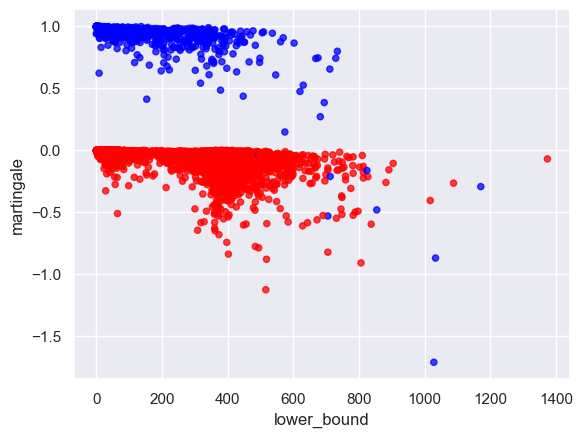

In [61]:
r.plot.scatter(
    x='lower_bound', y='martingale', c=np.where(r['death_observed'], 'blue', 'red'),
    alpha=0.75
)

In [62]:
r = cph.compute_residuals(X_train_scale, 'deviance')
r.head()

D:\Program Files\anacondav2\lib\site-packages\lifelines\utils\__init__.py:935: UserWarning: DataFrame Index is not unique, defaulting to incrementing index instead.
  warnings.warn("DataFrame Index is not unique, defaulting to incrementing index instead.")


,lower_bound,death_observed,deviance
ID,,,
7202,0.00001,False,-0.139766
4286,0.00001,False,-0.098912
12152,0.00001,False,-0.065456
256,0.00001,False,-0.036910
12802,0.00001,True,3.347194


<Axes: xlabel='lower_bound', ylabel='deviance'>

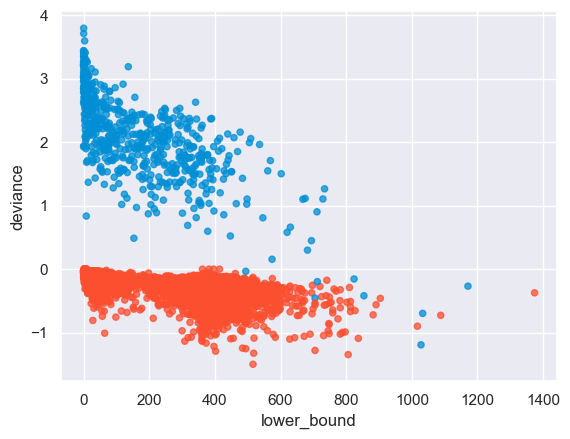

In [63]:
r.plot.scatter(
    x='lower_bound', y='deviance', c=np.where(r['death_observed'], '#008fd5', '#fc4f30'),
    alpha=0.75
)

In [65]:
r = cph.compute_residuals(X_train_scale, 'score')
r.head()

covariate,gender_2.0,cad_1.0,prior_acute_mi_1.0,prior_cardio_surg_1.0,prior_pci_1.0,prior_cabg_1.0,prior_valve_replace_1.0,prior_bav_1.0,prior_af_1.0,prior_generator_1.0,...,annulus_min_dim,perimeter,annulus_area_ctaort,ascending_ao,lmca_height,rca_height,iliac_mld_left,iliac_mld_right,femoral_mld_left,femoral_mld_right
ID,,,,,,,,,,,,,,,,,,,,,
7202,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
4286,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
12152,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
256,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,...,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000,-0.000000
12802,0.754236,0.846957,2.589487,-0.521744,1.697112,-0.398485,-0.290732,-0.433623,1.053101,2.235919,...,-0.017966,-0.075147,-0.004863,0.749668,-0.024548,-0.189701,0.185582,1.580235,2.329892,-0.055986


In [78]:
cph.check_assumptions(X_train_scale, p_value_threshold=0.05, show_plots=False)

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.



<lifelines.StatisticalResult: proportional_hazard_test>
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 12898 total observations, 12313 right-censored observations>
         test_name = proportional_hazard_test

---
                                  test_statistic    p  -log2(p)
age                         km              0.03 0.86      0.22
                            rank            0.01 0.93      0.10
albumin                     km              0.41 0.52      0.94
                            rank            3.25 0.07      3.81
anaesthesia_2.0             km              0.08 0.78      0.35
                            rank            0.01 0.91      0.14
anaesthesia_4.0             km              0.26 0.61      0.72
                            rank            0.13 0.72      0.48
annulus_area_ctaort         km              0.15 0.70      0.51
                            rank            0.99 0.32      1.65
annulus_max_dim             km              0.06 0.81      0.30
                            rank            0.34 0.56      0.84
annulus_min_dim             km              0.02 0.88      0.18
                            rank            0.61 0.44      1.20
aortic_insuff_2.0           km              0.10 0.75      0.41
                            rank            0.37 0.54      0.88
aortic_insuff_3.0           km              0.01 0.93      0.10
                            rank            0.00 0.97      0.04
aortic_insuff_4.0           km              0.08 0.78      0.37
                            rank            0.01 0.93      0.10
artery_calc_2.0             km              0.50 0.48      1.06
                            rank            5.17 0.02      5.45
artery_calc_3.0             km              0.02 0.89      0.17
                            rank            1.28 0.26      1.95
artery_calc_4.0             km              0.01 0.93      0.10
                            rank            3.02 0.08      3.61
ascending_ao                km              0.01 0.93      0.10
                            rank            0.03 0.86      0.22
av_area_tte                 km              1.28 0.26      1.96
                            rank            4.17 0.04      4.60
av_disease_etiology_2.0     km              0.14 0.71      0.50
                            rank            0.00 0.99      0.01
av_mean_grad_tte            km              0.01 0.93      0.10
                            rank            0.50 0.48      1.05
av_peak_vel                 km              0.00 0.97      0.04
                            rank            0.76 0.38      1.38
cad_1.0                     km              0.06 0.81      0.30
                            rank            0.36 0.55      0.87
chronic_lung_2.0            km              0.54 0.46      1.12
                            rank            1.18 0.28      1.85
chronic_lung_3.0            km              0.02 0.88      0.18
                            rank            0.73 0.39      1.35
chronic_lung_4.0            km              0.03 0.86      0.22
                            rank            0.06 0.81      0.31
ckd_1.0                     km              0.54 0.46      1.11
                            rank            0.03 0.86      0.21
creatinine                  km              0.25 0.62      0.70
                            rank            0.59 0.44      1.17
device_manufacturer_1_2.0   km              0.63 0.43      1.22
                            rank            5.89 0.02      6.03
device_manufacturer_1_3.0   km              0.45 0.50      0.99
                            rank            0.97 0.33      1.62
diabetes_1.0                km              0.01 0.94      0.10
                            rank            2.52 0.11      3.15
dialysis_1.0                km              0.01 0.91      0.14
                            rank            1.35 0.24      2.03
diseased_vessels_number_2.0 km              0.03 0.87      0.21
       



1. Variable 'prior_carotid_sten_5.0' failed the non-proportional test: p-value is 0.0174.

   Advice: with so few unique values (only 2), you can include `strata=['prior_carotid_sten_5.0',
...]` in the call in `.fit`. See documentation in link [E] below.

2. Variable 'hypertension_1.0' failed the non-proportional test: p-value is 0.0316.

   Advice: with so few unique values (only 2), you can include `strata=['hypertension_1.0', ...]` in
the call in `.fit`. See documentation in link [E] below.

3. Variable 'meds_beta_blocker_1.0' failed the non-proportional test: p-value is 0.0300.

   Advice: with so few unique values (only 2), you can include `strata=['meds_beta_blocker_1.0',
...]` in the call in `.fit`. See documentation in link [E] below.

4. Variable 'nyha_status_3.0' failed the non-proportional test: p-value is 0.0384.

   Advice: with so few unique values (only 2), you can include `strata=['nyha_status_3.0', ...]` in
the call in `.fit`. See documentation in link [E] below.

5.

[]


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lin

D:\Program Files\anacondav2\lib\site-packages\lifelines\fitters\mixins.py:119: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()



   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...

The ``p_value_threshold`` is set at 0.05. Even under the null hypothesis of no violations, some
covariates will be below the threshold by chance. This is compounded when there are many covariates.
Similarly, when there are lots of observations, even minor deviances from the proportional hazard
assumption will be flagged.

With that in mind, it's best to use a combination of statistical tests and visual tests to determine
the most serious violations. Produce visual plots using ``check_assumptions(..., show_plots=True)``
and looking for non-constant lines. See link [A] below for a full example.



<lifelines.StatisticalResult: proportional_hazard_test>
 null_distribution = chi squared
degrees_of_freedom = 1
             model = <lifelines.CoxPHFitter: fitted with 12898 total observations, 12313 right-censored observations>
         test_name = proportional_hazard_test

---
                                  test_statistic      p  -log2(p)
age                         km              0.14   0.71      0.50
                            rank            0.98   0.32      1.63
albumin                     km              1.47   0.22      2.15
                            rank            0.45   0.50      0.99
anaesthesia_2.0             km              0.02   0.88      0.18
                            rank            0.40   0.53      0.92
anaesthesia_4.0             km              0.09   0.76      0.40
                            rank            1.24   0.27      1.91
annualar_calc_ctaort_1.0    km              0.56   0.45      1.14
                            rank            4.22   0.04      4.64
annulus_area_ctaort         km              0.19   0.66      0.59
                            rank            1.13   0.29      1.80
annulus_max_dim             km              0.00   0.97      0.04
                            rank            0.19   0.67      0.58
annulus_min_dim             km              0.27   0.60      0.74
                            rank            0.41   0.52      0.93
aortic_insuff_2.0           km              0.01   0.93      0.11
                            rank            0.09   0.76      0.39
aortic_insuff_3.0           km              0.00   0.96      0.06
                            rank            0.07   0.79      0.35
aortic_insuff_4.0           km              0.08   0.78      0.36
                            rank            0.06   0.81      0.31
artery_calc_2.0             km              0.19   0.67      0.59
                            rank            0.25   0.62      0.70
artery_calc_3.0             km              0.03   0.87      0.21
                            rank            0.80   0.37      1.43
artery_calc_4.0             km              0.21   0.64      0.64
                            rank            0.19   0.66      0.60
ascending_ao                km              0.03   0.86      0.22
                            rank            0.00   0.95      0.07
av_area_tte                 km              0.66   0.42      1.26
                            rank            0.65   0.42      1.26
av_disease_etiology_2.0     km              0.06   0.80      0.32
                            rank            2.63   0.10      3.26
av_mean_grad_tte            km              0.03   0.87      0.21
                            rank            1.33   0.25      2.01
av_peak_vel                 km              0.00   0.96      0.06
                            rank            0.02   0.88      0.19
cad_1.0                     km              0.07   0.79      0.34
                            rank            0.47   0.49      1.02
chronic_lung_2.0            km              0.46   0.50      1.00
                            rank            0.31   0.58      0.79
chronic_lung_3.0            km              0.18   0.67      0.58
                            rank            0.43   0.51      0.96
chronic_lung_4.0            km              0.01   0.93      0.10
                            rank            0.07   0.79      0.34
ckd_1.0                     km              0.53   0.47      1.10
                            rank            2.48   0.12      3.11
creatinine                  km              0.42   0.52      0.95
                            rank            0.57   0.45      1.15
device_manufacturer_1_2.0   km              0.11   0.74      0.44
                            rank            1.49   0.22      2.17
device_manufacturer_1_3.0   km              0.45   0.50      0.99
                            rank            0.03   0.87      0.20
diabetes_1.0                km              0.08   0.78      0.35
                       



1. Variable 'meds_aspirin_1.0' failed the non-proportional test: p-value is 0.0342.

   Advice: with so few unique values (only 2), you can include `strata=['meds_aspirin_1.0', ...]` in
the call in `.fit`. See documentation in link [E] below.

   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


   Bootstrapping lowess lines. May take a moment...


2. Variable 'ecg_conduct_none_1.0' failed the non-proportional test: p-value is 0.0327.

   Advice: with so few unique values (only 2), you can include `strata=['ecg_conduct_none_1.0',
...]` in the call in `.fit`. 

[[<Axes: xlabel='rank-transformed time\n(p=0.1599)'>,
  <Axes: xlabel='km-transformed time\n(p=0.7038)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.4922)'>,
  <Axes: xlabel='km-transformed time\n(p=0.7906)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.2159)'>,
  <Axes: xlabel='km-transformed time\n(p=0.4451)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.9311)'>,
  <Axes: xlabel='km-transformed time\n(p=0.7751)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.2784)'>,
  <Axes: xlabel='km-transformed time\n(p=0.4190)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.8737)'>,
  <Axes: xlabel='km-transformed time\n(p=0.5767)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.3013)'>,
  <Axes: xlabel='km-transformed time\n(p=0.8958)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.7664)'>,
  <Axes: xlabel='km-transformed time\n(p=0.8067)'>],
 [<Axes: xlabel='rank-transformed time\n(p=0.3714)'>,
  <Axes: xlabel='km-transformed time\n(p=0.9236)'>],
 [<Axes: xlabel='rank-transformed tim

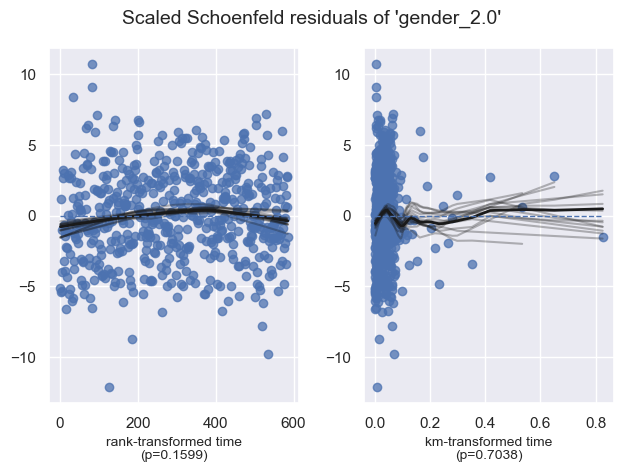

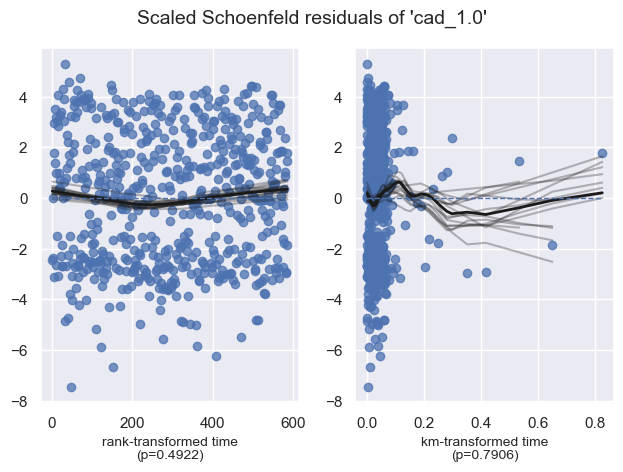

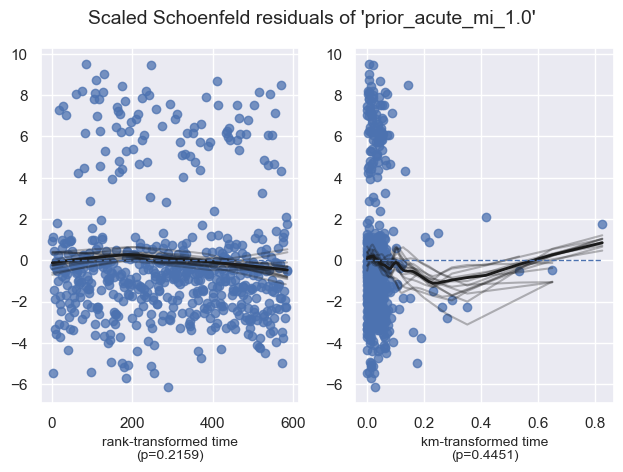

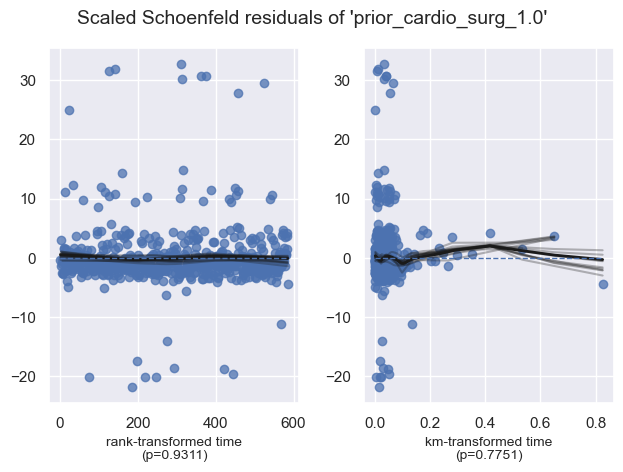

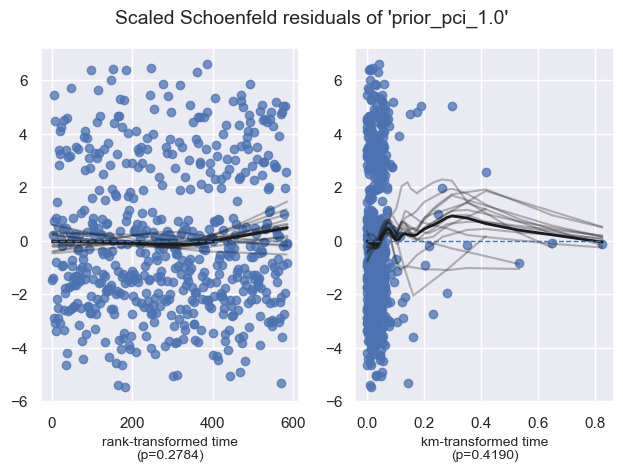

...

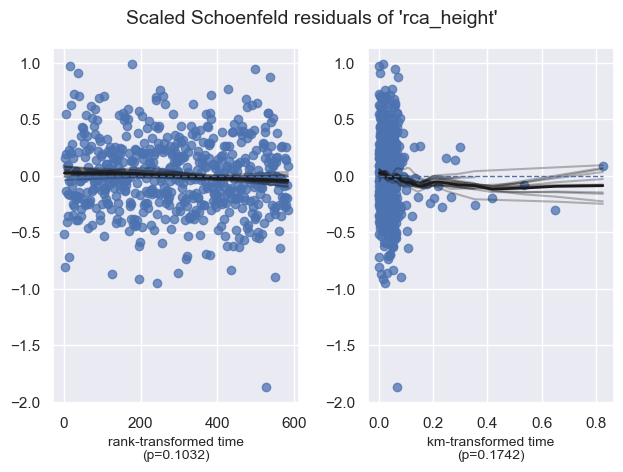

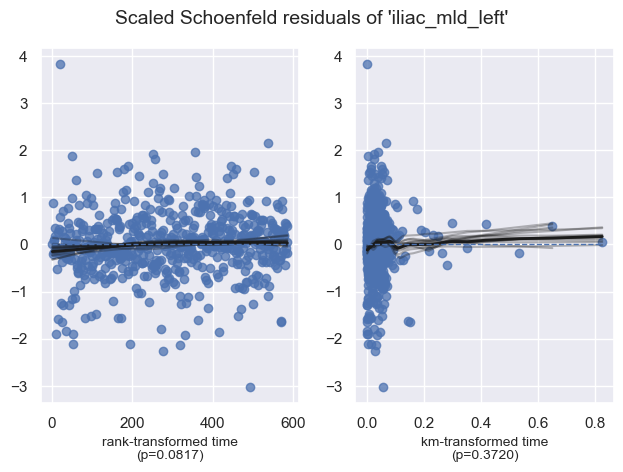

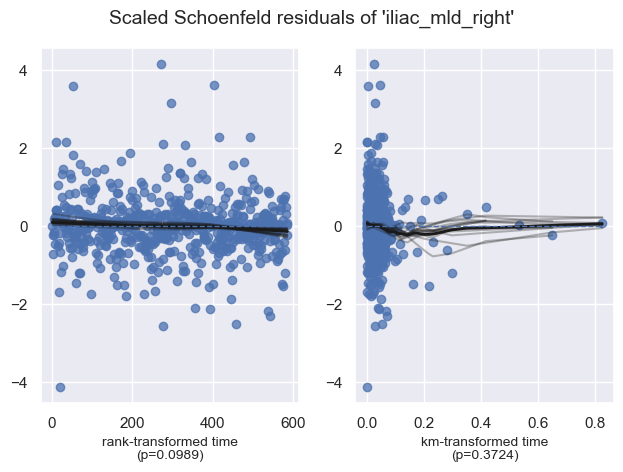

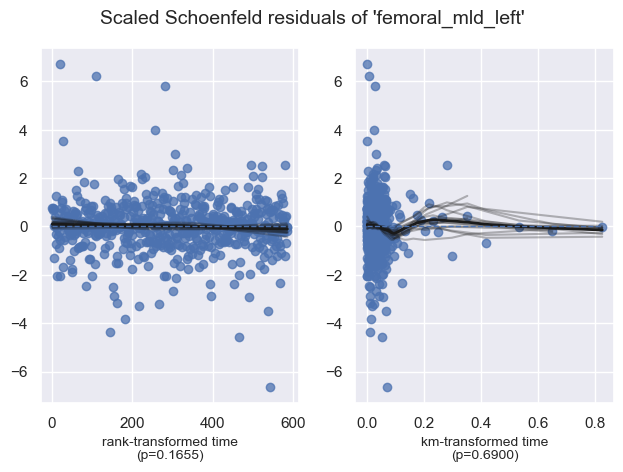

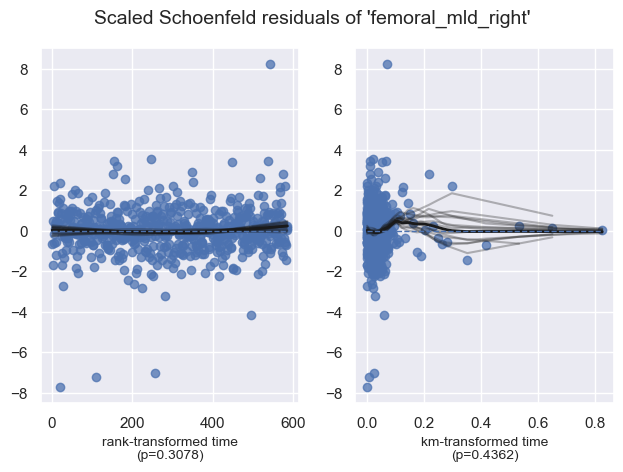

In [32]:
cph.check_assumptions(X_train, p_value_threshold=0.05, show_plots=True)

<Axes: >

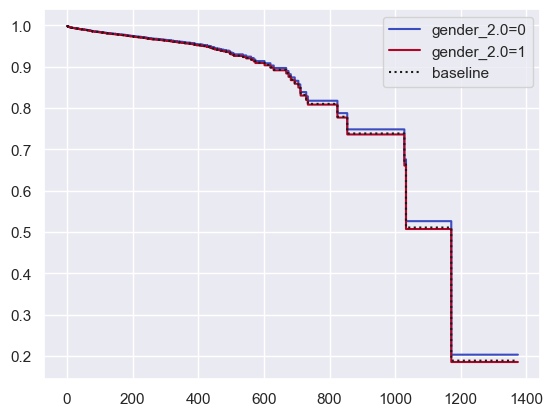

In [10]:
cph.plot_partial_effects_on_outcome(covariates='gender_2.0', values=[0,1], cmap='coolwarm')

## Cross Validation

In [16]:
n_folds = 5
seed = 108

In [46]:
penalty = [0,1e-4,1e-3,2e-3,4e-3,7e-3,1e-2,2e-2,4e-2,7e-2]

In [69]:
results_df = pd.DataFrame(columns = ["penalty","CI","n_features"])
for p in penalty:
    cph = CoxPHFitter(l1_ratio = 1, penalizer = p)

    scores = k_fold_cross_validation(
            cph, 
            X_train_scale, 
            duration_col='lower_bound', 
            event_col='death_observed', 
            scoring_method='concordance_index',
            k=n_folds,
            seed = seed)
    
    cph = CoxPHFitter(l1_ratio = 1, penalizer = p)
    cph.fit(X_train_scale, 
        duration_col='lower_bound', 
        event_col='death_observed')
    temp_results = pd.DataFrame([[p,np.mean(scores),sum(cph.params_ > 1e-5)]],columns = ["penalty","CI","n_features"])
    results_df = pd.concat([results_df,temp_results],axis = 0)

In [110]:
results_df

,penalty,CI,n_features
0,0,0.683209,44
0,0.0001,0.684433,44
0,0.001,0.689036,32
0,0.002,0.690910,23
0,0.004,0.687732,15
0,0.007,0.671024,8
0,0.01,0.650879,5
0,0.02,0.664444,0
0,0.04,0.685123,0
0,0.07,0.684892,0


In [71]:
results_df.to_csv("results/cox_results.csv")

In [111]:
cph = CoxPHFitter(l1_ratio = 1, penalizer = 2e-3)
cph.fit(X_train_scale, 
        duration_col='lower_bound', 
        event_col='death_observed')

<lifelines.CoxPHFitter: fitted with 12898 total observations, 12313 right-censored observations>

In [113]:
cph.print_summary()

<lifelines.CoxPHFitter: fitted with 12898 total observations, 12313 right-censored observations>
             duration col = 'lower_bound'
                event col = 'death_observed'
                penalizer = 0.002
                 l1 ratio = 1
      baseline estimation = breslow
   number of observations = 12898
number of events observed = 585
   partial log-likelihood = -4943.16
         time fit was run = 2024-05-31 05:29:05 UTC

---
                              coef  exp(coef)   se(coef)   coef lower 95%   coef upper 95%  exp(coef) lower 95%  exp(coef) upper 95%
covariate                                                                                                                           
gender_2.0                    0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
cad_1.0                       0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_acute_mi_1.0           -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_cardio_surg_1.0        -0.00       1.00       0.05            -0.09             0.09                 0.91                 1.09
prior_pci_1.0                 0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_cabg_1.0               -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_valve_replace_1.0      -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_bav_1.0                 0.01       1.01       0.03            -0.06             0.07                 0.95                 1.08
prior_af_1.0                  0.09       1.10       0.05            -0.00             0.19                 1.00                 1.21
prior_generator_1.0           0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_ccf_1.0                 0.10       1.10       0.04             0.01             0.18                 1.01                 1.19
prior_stroke_1.0              0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_tia_1.0                -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_carotid_sten_2.0        0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_carotid_sten_3.0       -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_carotid_sten_4.0       -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_carotid_sten_5.0        0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
prior_pad_1.0                 0.11       1.11       0.04             0.03             0.18                 1.03                 1.20
chronic_lung_2.0              0.02       1.02       0.04            -0.06             0.10                 0.94                 1.11
chronic_lung_3.0              0.09       1.09       0.04             0.01             0.16                 1.01                 1.17
chronic_lung_4.0              0.07       1.07       0.03             0.00             0.14                 1.00                 1.15
hypertension_1.0             -0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
diabetes_1.0                  0.00       1.00       0.00            -0.00             0.00                 1.00                 1.00
ckd_1.0                       0.03       1.03       0.05            -0.06             0.13                 0.94                 1.13
dialysis_1.0                  0.02       1.02       0.04            -0.07             0.11        

(0.9, 1.0)

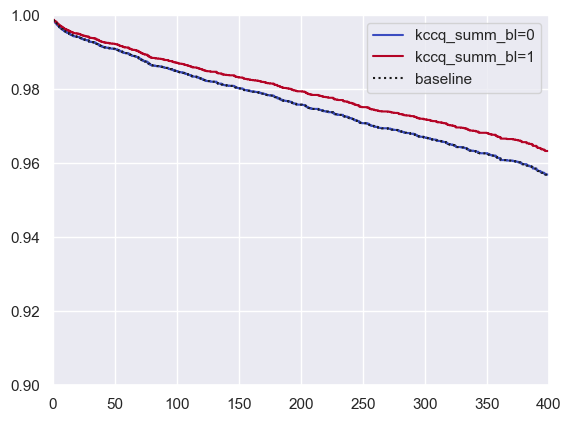

In [118]:
ax = cph.plot_partial_effects_on_outcome(covariates='kccq_summ_bl', values=[0,1], cmap='coolwarm')
ax.set_xlim([0,400])
ax.set_ylim([0.9,1.0])

In [109]:
cph.print_summary()

model,lifelines.CoxPHFitter
duration col,'lower_bound'
event col,'death_observed'
penalizer,0.002
l1 ratio,1
number of baseline knots,2
baseline estimation,spline
number of observations,12898
number of events observed,585
log-likelihood,-5269.63
time fit was run,2024-05-31 05:07:46 UTC


In [102]:
print(cph.AIC_)
print(cph.score(X_train_scale))
print(cph.score(X_train_scale,scoring_method='concordance_index'))

10733.252195624247
-0.4029818821442069


D:\Program Files\anacondav2\lib\site-packages\lifelines\fitters\__init__.py:2371: ApproximationWarning: Approximating using `predict_survival_function`. To increase accuracy, try using or increasing the resolution of the timeline kwarg in `.fit(..., timeline=timeline)`.

  warnings.warn(


0.5123179352267616
